<center><img src="https://github.com/hse-ds/iad-applied-ds/blob/master/2021/hw/hw1/img/logo_hse.png?raw=1" width="1000"></center>

<h1><center>Прикладные задачи анализа данных</center></h1>
<h2><center>Домашнее задание 3: прогнозирование временных рядов</center></h2>

**Мягкий дедлайн:** 23:59MSK 19.05.2024

**Жесткий дедлайн:** 23:59MSK 26.05.2024

In [1]:
import gdown
url = 'https://raw.githubusercontent.com/hse-ds/iad-applied-ds/2024/homeworks/hw3_ts/requirements.txt'
output = "requirements.txt"
gdown.download(url=url, output=output, quiet=False, fuzzy=True)

Downloading...
From: https://raw.githubusercontent.com/hse-ds/iad-applied-ds/2024/homeworks/hw3_ts/requirements.txt
To: /content/requirements.txt
 72%|███████▏  | 43.0/60.0 [00:00<00:00, 103kB/s]


'requirements.txt'

In [2]:
!pip install -r requirements.txt

In [3]:
import warnings
import pandas as pd
import numpy as np
from copy import deepcopy

warnings.filterwarnings("ignore")

В данной задаче мы будем решать одну из актуальных практических задач, с которыми, в том числе, сталкиваются разработчики ETNA - прогнозирование объема необходимой наличности в банкоматах. Пожалуй, ни для кого не секрет, что отсутствие необходимой суммы в банкомате не делает клиента банка счастливее. В то же время, избыток заправленной в банкомат наличности приводит к упущенной выгоде - ведь, в конечном счете, эти деньги могли быть размещены в качестве краткосрочного депозита на межбанковском рынке. Для кредитной организации с обширной сетью банкоматов даже незначительное улучшение качества предсказания способно внести значительный вклад в прибыльность этой ветки бизнеса.

В качестве инструмента воспользуемся библиотекой ETNA, документацию можно прочитать [тут](https://docs.etna.ai/stable/), и [чат](https://t.me/etna_support) комьюнити.

Мы будем использовать дневные данные реальных банкоматов для чего возьмем мультисегментный датасет.

In [4]:
url = 'https://gist.githubusercontent.com/Polzovat123/4d6d5e544e93429c2d3db29196e9c918/raw/24b27e60f587128d71678e267f51cd48472c6a84/atms_daily_cash.csv'
output = 'atms_daily_cash.csv'
gdown.download(url=url, output=output, quiet=False, fuzzy=True)

df = pd.read_csv('atms_daily_cash.csv', index_col=False)

Downloading...
From: https://gist.githubusercontent.com/Polzovat123/4d6d5e544e93429c2d3db29196e9c918/raw/24b27e60f587128d71678e267f51cd48472c6a84/atms_daily_cash.csv
To: /content/atms_daily_cash.csv
100%|██████████| 258k/258k [00:00<00:00, 6.35MB/s]


Полученные данные были просуммированы по банкоматам и дням эксплуатации, после чего залиты в gist, откуда мы и берем их.

Взглянем на то, что представляют из себя данные после этих действий:

In [5]:
df.head()

,datetime,atm_id,operation_value
0,2017-08-16,74,2.059266
1,2017-08-17,74,1.029633
2,2017-08-18,74,0.686422
3,2017-08-19,74,33.301267
4,2017-08-20,74,-12.237921


### Задание 1. EDA (1.75 балл)

Проведите разведывательный анализ данных с помощью `ETNA`- постройте графики, на которых можно судить о наличии тренда, сезонности и прочих зависимостей. Проанализируйте корреляции. Какие выводы вы можете сделать?

Ссылку на туториал по EDA можно найти [тут](https://docs.etna.ai/stable/tutorials/103-EDA.html#EDA).

In [6]:
from etna.datasets import TSDataset
from etna.analysis import acf_plot
from etna.analysis import seasonal_plot
from etna.analysis import plot_trend
from etna.analysis import plot_correlation_matrix
from etna.transforms import LinearTrendTransform
from etna.transforms import LagTransform

In [7]:
df["timestamp"] = pd.to_datetime(df["datetime"])
df["target"] = df["operation_value"]
df["segment"] = df["atm_id"]
df.drop(columns=["datetime", "operation_value", "atm_id"], inplace=True)
df.head()

,timestamp,target,segment
0,2017-08-16,2.059266,74
1,2017-08-17,1.029633,74
2,2017-08-18,0.686422,74
3,2017-08-19,33.301267,74
4,2017-08-20,-12.237921,74


In [8]:
ts = TSDataset(df, freq="D")
ts.info()

<class 'etna.datasets.TSDataset'>
num_segments: 20
num_exogs: 0
num_regressors: 0
num_known_future: 0
freq: D
         start_timestamp end_timestamp  length  num_missing
segments                                                   
100           2017-08-11    2018-09-30     416            3
101           2017-08-11    2018-09-30     416            3
102           2017-08-02    2018-09-30     425            3
103           2017-08-08    2018-09-30     419            3
104           2017-08-07    2018-09-30     420            3
105           2017-07-28    2018-09-30     430            3
106           2017-08-09    2018-09-30     418            3
74            2017-08-16    2018-09-30     411            3
85            2017-08-03    2018-09-30     424            3
86            2017-08-01    2018-09-30     426            3
87            2017-06-09    2018-09-30     479            3
88            2017-08-14    2018-09-30     413            3
90            2017-07-27    2018-09-30     431    

In [9]:
ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
100,2017-08-11,2018-09-30,416,3,20,0,0,0,D
101,2017-08-11,2018-09-30,416,3,20,0,0,0,D
102,2017-08-02,2018-09-30,425,3,20,0,0,0,D
103,2017-08-08,2018-09-30,419,3,20,0,0,0,D
104,2017-08-07,2018-09-30,420,3,20,0,0,0,D
105,2017-07-28,2018-09-30,430,3,20,0,0,0,D
106,2017-08-09,2018-09-30,418,3,20,0,0,0,D
74,2017-08-16,2018-09-30,411,3,20,0,0,0,D
85,2017-08-03,2018-09-30,424,3,20,0,0,0,D


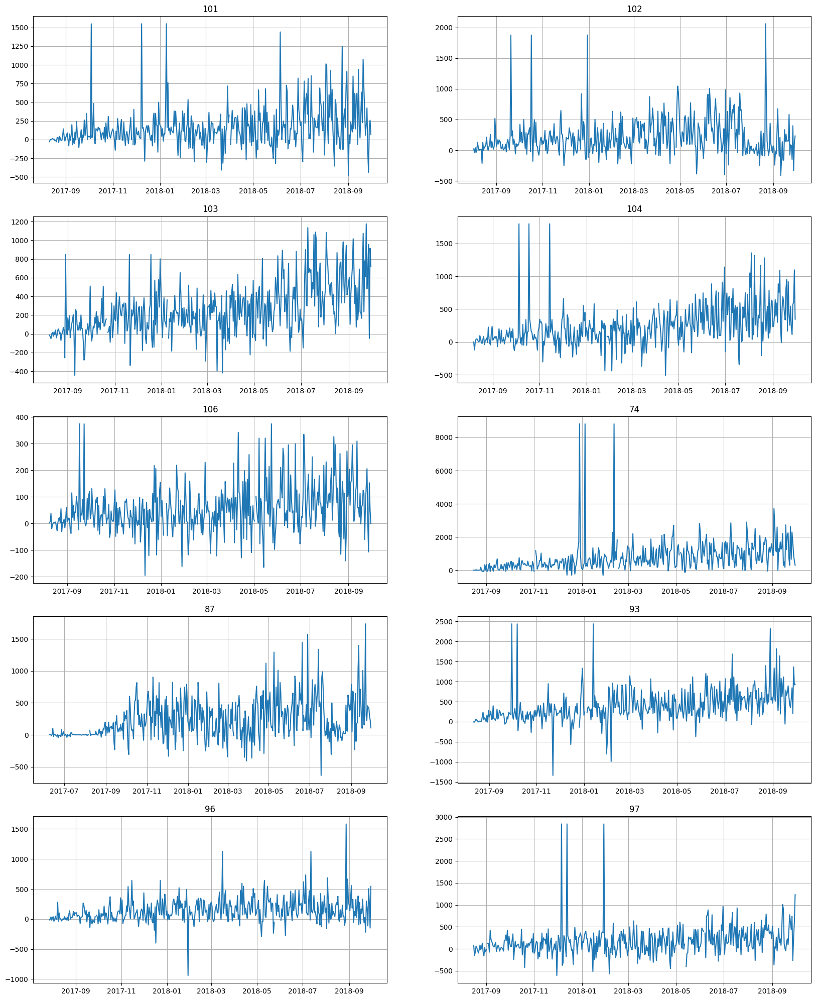

In [10]:
ts.plot()

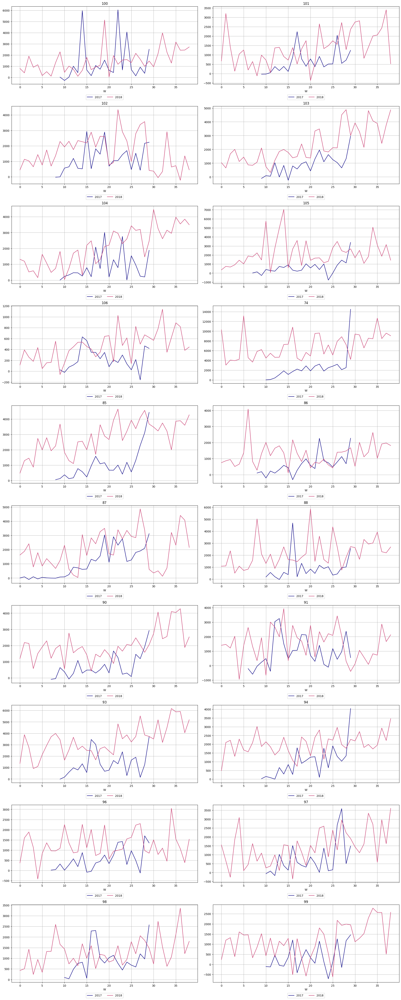

In [11]:
seasonal_plot(ts=ts, freq='W')

Чтобы понять есть сезонность или нет, нам необходимо найти на графиках регулярно повторяющийся паттерн с фиксированным периодом. На графиках видим часто сменяющиеся скачки, однако явных таких паттернов не наблюдается.

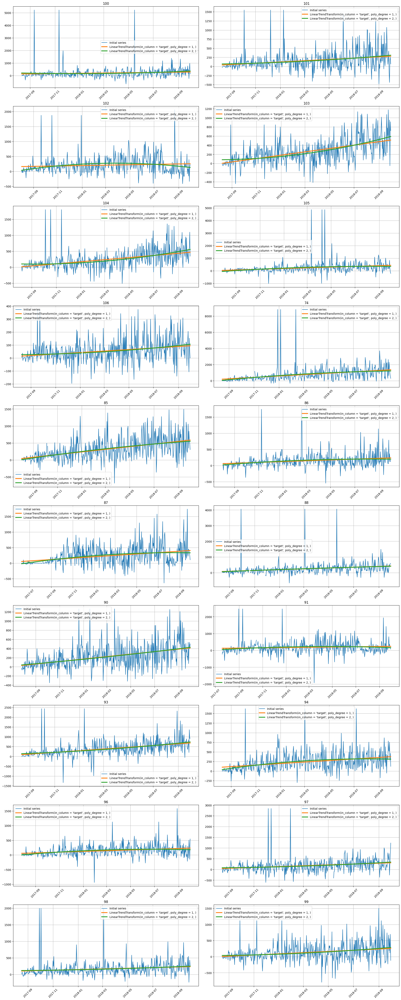

In [57]:
trends = [
    LinearTrendTransform(in_column="target", poly_degree=1),
    LinearTrendTransform(in_column="target", poly_degree=2),
]
plot_trend(ts, trend_transform=trends)

Заметим, что для временных рядов 91 и 100 тренд почти отсутствует. Для остальных присутствует возрастающий линейный тренд; приэтом если мы говорим о квадратичном тренде, то для рядов 102, 105, 74, 85, 86, 87, 91, 94, 96 наблюдается возрастающий квадратичный тренд, за которым следует убыващий, для оставшихся - только возрастающий.

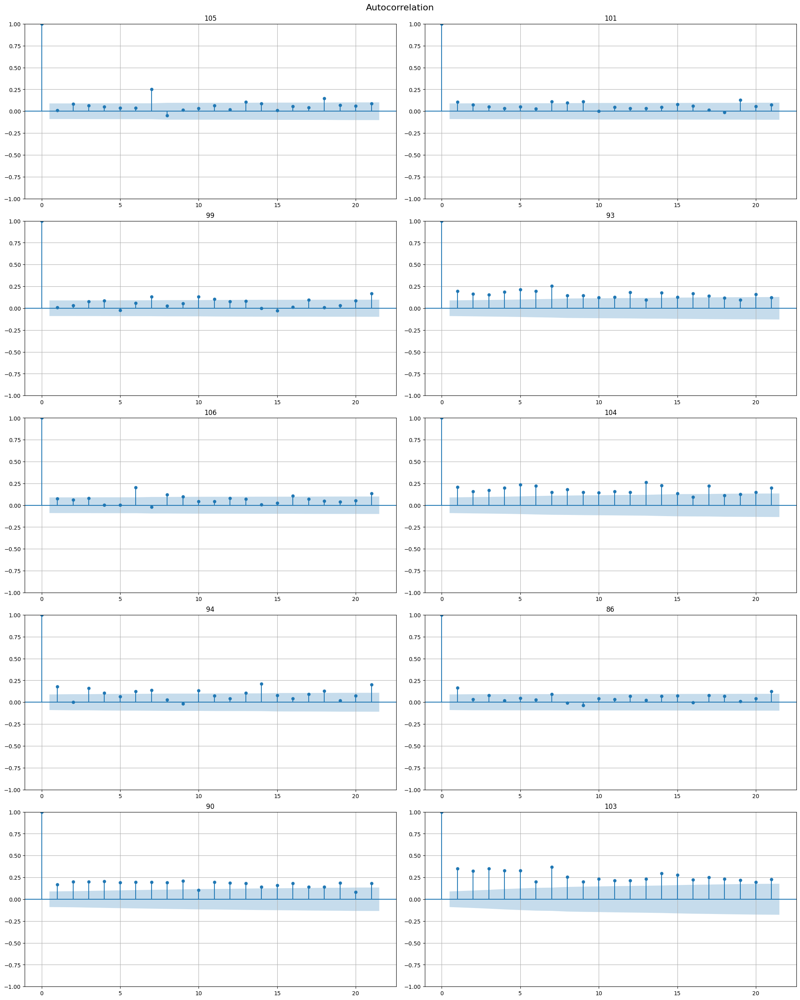

In [ ]:
acf_plot(ts, lags=21)

Для банкомата 103 наблюдается наиболее значимая автокорреляция: $\approx$ 0.4: с 1-го по 5-й лагами, а также с 7-м. Для остальных же банкоматов автокорреляция не превышает значение 0.3. Рассмотрим наиболее значимые лаги для временных рядов. У временных рядов 101, 99 автокорреляции почти нету. Для банкоматов 93, 90 автокорелляция почти со всеми лагами $\approx$ 0.2. Для 105-го и 93-го с 7-м лагом 0.25, для 104-го с 9-м лагом 0.3.

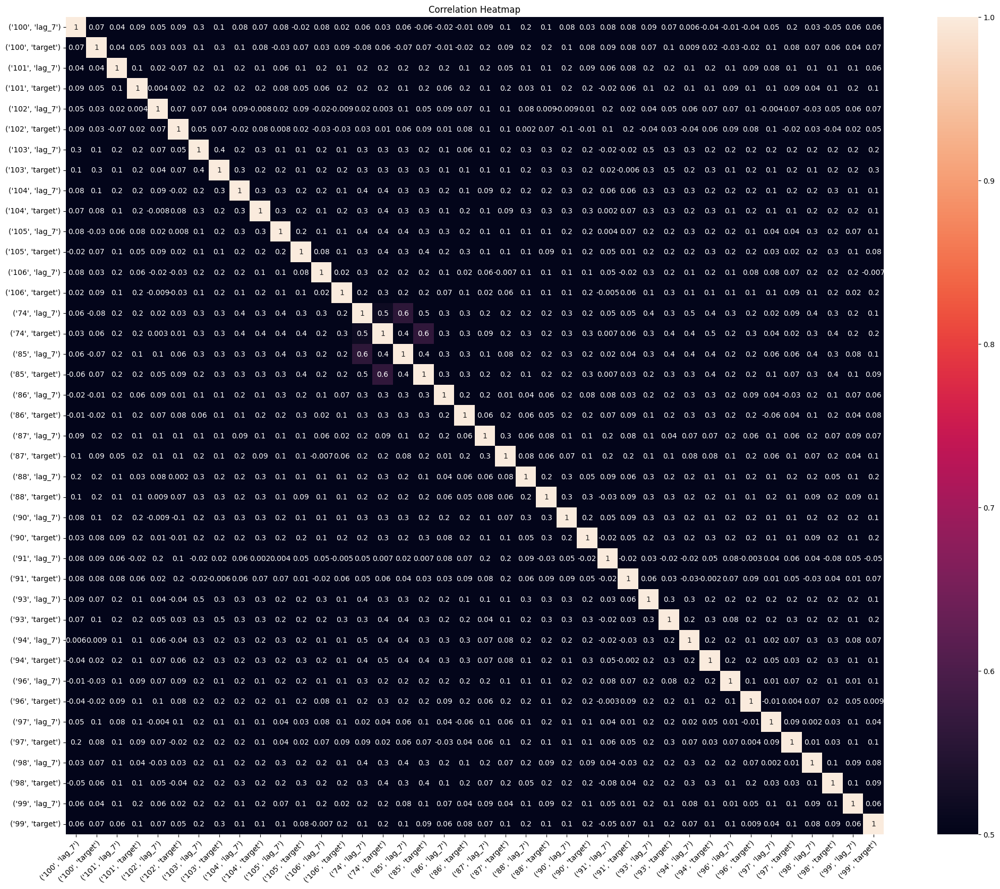

In [ ]:
ts_copy = TSDataset(df, freq="D")

lags = LagTransform(in_column="target", lags=[7], out_column="lag")
ts_copy.fit_transform([lags])
plot_correlation_matrix(ts_copy, method="spearman", vmin=0.5, vmax=1, figsize=(26, 20))

Корреляционная тепловая карта показывает, что 7-ые лаги банкоматов 74 и 85 коррелируют, а также таргеты этих банкоматов также коррелируют (корреляция 0.6). Для остальных рядов, их таргетов и их лагов, корреляции > 0.5 не наблюдается.

### Задание 2. Работа с пропущенными значениями и выбросами (1 балл)

Проанализируйте, есть ли в данных пропущенные значения, и подберите оптимальный метод их заполнения средствами ETNA. Какие методы вы выберете и почему? Совет: возможно, лучше сохранить заполненные данные в отдельный объект, поскольку некоторые модели заполняют пропуски встроенными методами, и подача на вход "сырых" данных (на языке временных рядов это данные с нерегулярными интервалами) может принести лучший результат.

Импорты всех необходимых компонент произведите самостоятельно.

**Для задания 4 нам будут необходимы исключительно неотрицательные числа. В таком случае необходимо решить, что делать с отрицательными значениями. В силу отсуствия в условии того, что означает отрицательное значение таргета, будем считать, что значение в таргете показывает то, насколько много денег необходимо доложить в банкомат. Если же это значение отрицательное, то это значит, что конкретный банкомат по итогам дня пополнил свою казну благодаря денежным операциям клиентов $\Rightarrow$ в банкомат необходимо доложить 0 для исправной работы.**

In [58]:
from etna.analysis import plot_anomalies
from etna.analysis import plot_anomalies_interactive
from etna.analysis.outliers import get_anomalies_median
from etna.transforms import MedianOutliersTransform
from etna.transforms import TimeSeriesImputerTransform

In [59]:
df.isna().sum(axis=0)

timestamp     0
target       60
segment       0
dtype: int64

In [60]:
ts.info()

<class 'etna.datasets.TSDataset'>
num_segments: 20
num_exogs: 0
num_regressors: 0
num_known_future: 0
freq: D
         start_timestamp end_timestamp  length  num_missing
segments                                                   
100           2017-08-11    2018-09-30     416            3
101           2017-08-11    2018-09-30     416            3
102           2017-08-02    2018-09-30     425            3
103           2017-08-08    2018-09-30     419            3
104           2017-08-07    2018-09-30     420            3
105           2017-07-28    2018-09-30     430            3
106           2017-08-09    2018-09-30     418            3
74            2017-08-16    2018-09-30     411            3
85            2017-08-03    2018-09-30     424            3
86            2017-08-01    2018-09-30     426            3
87            2017-06-09    2018-09-30     479            3
88            2017-08-14    2018-09-30     413            3
90            2017-07-27    2018-09-30     431    

Видим, что в каждом сегменте у нас по 3 пропущенных значения.

Логично, что пропущенные значения в случае с работой банкомата в конкретный день могут означать отсутствие операций с этим банкоматом. В таком случае очевидно, что для исправной работы банкомата в него необходимо доложить 0.

In [61]:
ts_clear = TSDataset(df, freq="D")

nans_imputer = TimeSeriesImputerTransform(in_column="target", strategy="constant", window=30, constant_value=0) # Заполняем NaN'ы нулём
ts_clear.fit_transform([nans_imputer])

Проверьте ряды на наличие выбросов, и очистите их соответствующим образом. Обоснуйте выбор.

Для начала необходимо обнаружить выбросы. Метод на основе плотности точек имеет немало параметров, которые необходимо тщательно подбирать под исходные данные (плохо подберем ⇒ получим плохое качество); метод на основе предсказаний модели работает только в связке с `ProphetModel` и `SARIMAXModel` ⇒ надо выбирать лучшую модель. Воспользуемся методом отклонения от медианных значений, рассчитанных по окну, который имеет меньше гиперпараметров, чем первый метод и не требует конкретной модели в отличие от второго метода.

In [62]:
segment = "96"
method = get_anomalies_median
params_bounds = {"window_size": (40, 70, 1), "alpha": (0.1, 4, 0.25)}
plot_anomalies_interactive(ts=ts_clear, segment=segment, method=method, params_bounds=params_bounds)

interactive(children=(IntSlider(value=40, continuous_update=False, description='window_size', max=70, min=40, …

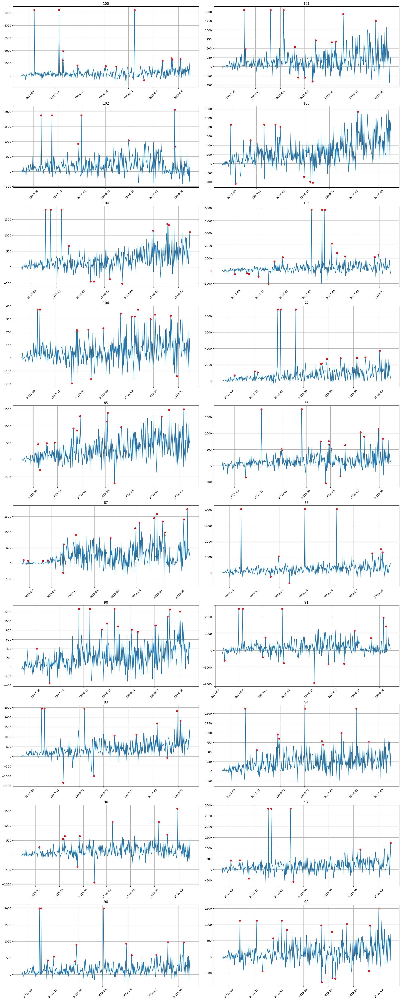

In [17]:
best_params = {"window_size": 40, "alpha": 2.35}

anomaly_dict = get_anomalies_median(ts_clear, **best_params)
plot_anomalies(ts_clear, anomaly_dict)

Заполнять выбросы какой-либо константой странно, ведь у нас нет оснований предполагать, что в банкомат надо докладывать какое-то конкретное значение. Воспользуемся стратегией скользящего среднего - ведь тогда новое значение выброса не будет "выделяться" среди соседних значений.

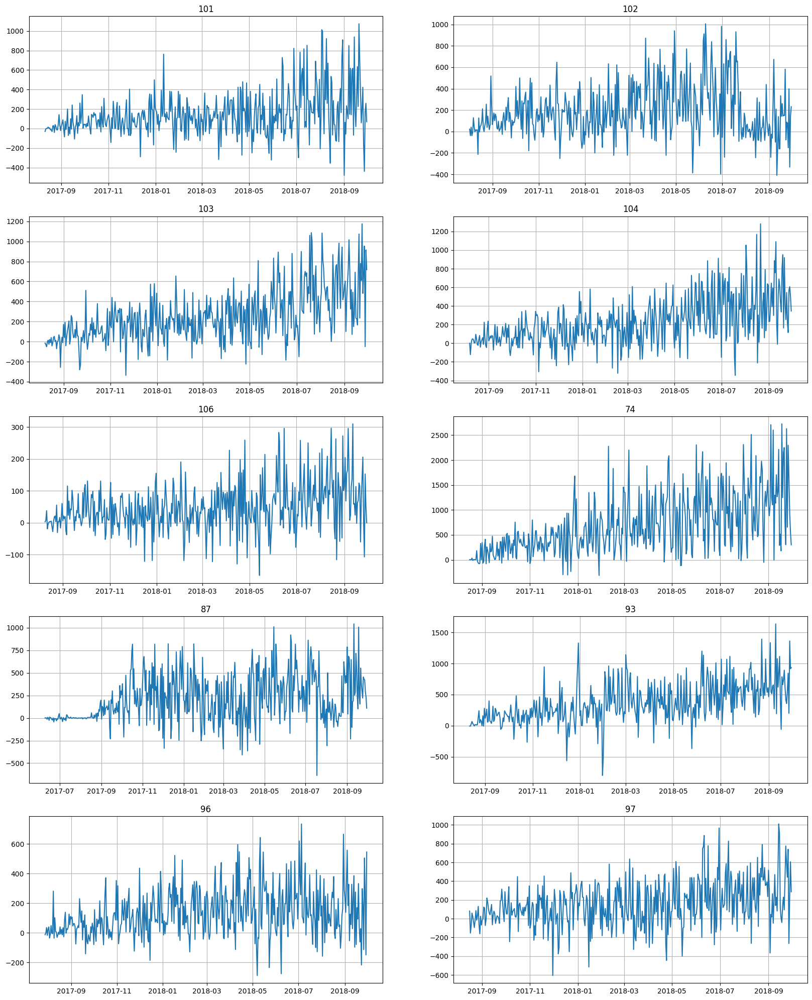

In [18]:
outliers_remover = MedianOutliersTransform(in_column="target", **best_params) # Заменяем выбросы на NaN'ы
outliers_imputer = TimeSeriesImputerTransform(in_column="target", strategy="running_mean", window=30) # Заполняем NaN'ы
ts_clear.fit_transform([outliers_remover, outliers_imputer])
ts_clear.plot()

### Задание 3. Построение Prophet (1.25 балла)

Постройте прогнозы с помощью Prophet и `etna.Pipeline`, под капотом `etna.Pipeline` обучит `ProphetModel` для каждого сегмента в отдельности. После этого оцените качество по SMAPE на кросс-валидации. В качестве горизонта предсказания возьмите 5 дней - этого же горизонта будем придерживаться и в дальнейшем.

Отрисуйте получившийся прогноз.

In [19]:
from etna.pipeline import Pipeline
from etna.models import ProphetModel
from etna.metrics import SMAPE, MAE
from etna.analysis import plot_backtest

In [20]:
HORIZON = 5

In [21]:
prophet_pipeline = Pipeline(model=ProphetModel(), horizon=HORIZON)

In [22]:
smape_prophet, forecast_prophet, fold_info_prophet = prophet_pipeline.backtest(ts=ts_clear, metrics=[SMAPE()], aggregate_metrics=True)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/3uewueb8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/s8xb5ron.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67787', 'data', 'file=/tmp/tmpq9fjolgi/3uewueb8.json', 'init=/tmp/tmpq9fjolgi/s8xb5ron.json', 'output', 'file=/tmp/tmpq9fjolgi/prophet_modelttp194qp/prophet_model-20240514101245.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:12:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:12:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

In [23]:
smape_prophet.head()

,segment,SMAPE
0,100,82.366157
1,101,89.209849
2,102,95.590879
3,103,57.843615
4,104,51.258042


In [24]:
smape_prophet.mean()

segment    5.005055e+44
SMAPE      7.322929e+01
dtype: float64

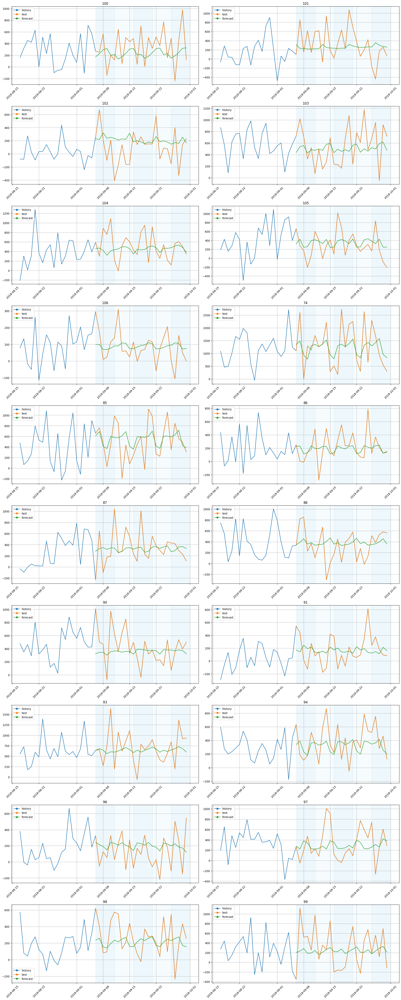

In [25]:
plot_backtest(forecast_prophet, ts_clear, history_len=20)

Исходя из статистики по каждому ряду, какой можно сделать вывод о том, как лучше предсказывать итоговое значение? Посчитайте то же самое исходя из MAE.

Анализируя полученные графики видим, что какие-то общие паттерны удалось уловить, а учесть особенности ряда - нет. Можем предположить, что если хорошо учтем компоненты тренда и сезонности, а также смещение в прогнозе, то при предсказании итогового значения получим прогноз лучше.

In [26]:
mae_prophet, _, _ = prophet_pipeline.backtest(ts=ts_clear, metrics=[MAE()], aggregate_metrics=True)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/zzv0_cfw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/n5sp98bk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=78168', 'data', 'file=/tmp/tmpq9fjolgi/zzv0_cfw.json', 'init=/tmp/tmpq9fjolgi/n5sp98bk.json', 'output', 'file=/tmp/tmpq9fjolgi/prophet_modelhdmbsr6e/prophet_model-20240514101320.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:13:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
10:13:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

In [27]:
mae_prophet.head()

,segment,MAE
0,100,241.035644
1,101,290.821185
2,102,211.364884
3,103,277.432636
4,104,231.419553


In [28]:
mae_prophet.mean()

segment    5.005055e+44
MAE        2.368448e+02
dtype: float64

### Задание 4. Иерархический временной ряд (2 балла)

Вопрос, поставленный в прошлом задании, тем не менее, естественным образом подводит нас к концепции **иерархического временного ряда** (когда один ряд состоит из других в качестве компонент). Это полезная концепция, которая может встретиться во многих задачах. В этом задании вам предстоит самостоятельно разобраться в деталях ее реализации в ETNA с использованием справочных материалов, предоставляемых библиотекой (как это часто бывает на практике). Они содержатся по следующей ссылке:

https://github.com/etna-team/etna/blob/master/examples/303-hierarchical_pipeline.ipynb

На выходе из первой части задания необходимо получить `TSDataset` с иерархической структурой, а также соответствующий реконсилятор, который позволит собирать искомый ряд из составных компонент. Классы, которые вам понадобятся, импортированы ниже.

In [ ]:
from etna.datasets import HierarchicalStructure
from etna.pipeline import HierarchicalPipeline
from etna.reconciliation import TopDownReconciliator

In [ ]:
segments = list(map(str, df.segment.unique()))

In [ ]:
hierarchical_structure = HierarchicalStructure(level_structure={"total": segments}, level_names=["total", "segment"])
hierarchical_structure

HierarchicalStructure(level_structure = {'total': ['74', '85', '86', '87', '88', '90', '91', '93', '94', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106']}, level_names = ['total', 'segment'], )

In [ ]:
positive_df = df.copy(deep=True)
positive_df.target = np.where(df.target < 0, 0, df.target)

In [ ]:
hierarchical_ts = TSDataset(df=positive_df, freq="D", hierarchical_structure=hierarchical_structure)
hierarchical_ts.tail()

segment,100,101,102,103,104,105,106,74,85,86,87,88,90,91,93,94,96,97,98,99
feature,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,,,,,,,,,,,
2018-09-26,489.428602,0.000000,0.000000,677.704316,114.818767,160.505046,2.794718,2297.228473,348.074726,120.378785,430.162938,511.345072,69.338415,243.022761,844.916685,517.022761,0.000000,739.570539,547.176294,187.216663
2018-09-27,0.000000,0.000000,398.467898,953.351729,568.916255,836.297187,0.000000,1693.304703,846.975950,367.520077,420.081361,382.935151,351.575478,374.727507,199.748765,753.397037,504.549495,0.000000,0.000000,560.208503
2018-09-28,447.007730,172.448787,0.000000,0.000000,606.659652,178.891346,153.091690,937.613056,557.207859,209.133133,293.298261,530.084389,536.821129,179.420872,1364.028130,280.413142,265.998282,250.818553,180.862358,116.142581
2018-09-29,976.797939,258.761434,140.942023,914.431608,1097.500322,0.000000,49.775392,553.560017,489.163839,123.820700,231.049603,580.889414,395.908525,93.372987,916.108439,463.364183,0.000000,606.012454,433.651922,696.149452
2018-09-30,125.791711,69.338415,231.490874,718.065922,345.633026,0.000000,0.000000,300.917543,306.448143,150.532317,108.611553,560.414430,501.695942,84.312218,935.583208,123.644192,544.499248,1232.882328,255.643118,0.000000


In [ ]:
model = ProphetModel()
reconciliator = TopDownReconciliator(target_level="segment", source_level="total", method="AHP", period=30)
hierarchical_pipeline = HierarchicalPipeline(model=model, reconciliator=reconciliator, horizon=HORIZON)

Во второй части задания примените найденные на предыдущих этапах преобразования очистку от выбросов уже к иерархическому датасету, и запустите на нем Prophet с MAE на кросс-валидации.

In [ ]:
hierarchical_ts_clear = TSDataset(df=positive_df, freq="D", hierarchical_structure=hierarchical_structure)
nans_imputer = TimeSeriesImputerTransform(in_column="target", strategy="constant", window=30, constant_value=0)
hierarchical_ts_clear.fit_transform([nans_imputer])

outliers_remover = MedianOutliersTransform(in_column="target", **best_params)
outliers_imputer = TimeSeriesImputerTransform(in_column="target", strategy="running_mean", window=30)
hierarchical_ts_clear.fit_transform([outliers_remover, outliers_imputer])

In [ ]:
hierarсhical_mae_df, _, _ = hierarchical_pipeline.backtest(ts=hierarchical_ts_clear, metrics=[MAE()], aggregate_metrics=True)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp8wrbex3g/4u5gs_o8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp8wrbex3g/2tdmjxs7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75615', 'data', 'file=/tmp/tmp8wrbex3g/4u5gs_o8.json', 'init=/tmp/tmp8wrbex3g/2tdmjxs7.json', 'output', 'file=/tmp/tmp8wrbex3g/prophet_model1ire1u38/prophet_model-20240513180217.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:02:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:02:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
[Parallel(n_jobs=1)]: Done   1 tasks    

In [ ]:
hierarсhical_mae_df.head()

,segment,MAE
0,100,224.589830
1,101,228.466048
2,102,97.081789
3,103,297.358063
4,104,232.871551


In [ ]:
hierarсhical_mae_df.mean()

segment    5.005055e+44
MAE        2.248208e+02
dtype: float64

Заметим, что мы получили результат лучше чем раньше. Без зануления отрицательных значений обойтись было нельзя, так как `TopDownReconciliator` с ними не работает.

### Задание 5. Построение признаков (1.5 балла)

Вернемся к нашему исходному мультисегментному ряду - теперь поработаем с моделями, которые требуют построения признаков - `ARIMA` и `CatBoost`. Построим для них признаки, и попробуем при помощи них добиться улучшения качества.

Из обязательного:
1) постройте графики автокорреляции и при помощи них обоснуйте выбор лаговых признаков
2) для катбуста включите в признаки результаты STL разложения. STL используем для убирания тренда за счет преобразования на месте.
* Кроме этого, подумайте на экспертном уровне,
    - Какие еще закономерности могут присутствовать и почему?
    - Что из этого кажется более предсказуемым, и почему?
    - Cделайте соответствующие признаки, и снабдите их кратким комментарием.

3) После этого, обучите на получившихся признаках модели. Для `CatBoost` рассмотрите 2 версии мультисегментную и на каждый ряд в отдельности.

Ниже приведены импорты, которые вам точно понадобятся - к ним необходимо добавить те инструменты, которые вы дополнительно решите использовать в анализе.

Вообще говоря применение ансамблей и стратегий будет в следующих двух номерах, но раз сказано "приведены импорты, которые вам точно понадобятся", то после построения отдельных моделей попробуем ансамбли.

In [29]:
from etna.analysis import acf_plot, stl_plot
from etna.ensembles import DirectEnsemble, StackingEnsemble, VotingEnsemble
from etna.models import (CatBoostMultiSegmentModel, CatBoostPerSegmentModel,
                         AutoARIMAModel)
from etna.transforms import STLTransform, LagTransform, SegmentEncoderTransform, DateFlagsTransform

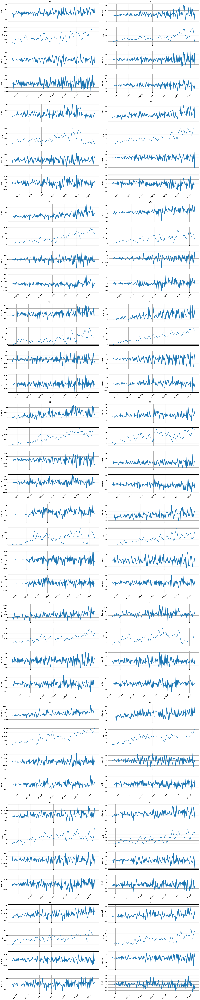

In [ ]:
stl_plot(ts=ts_clear, period=7)

#### 1)

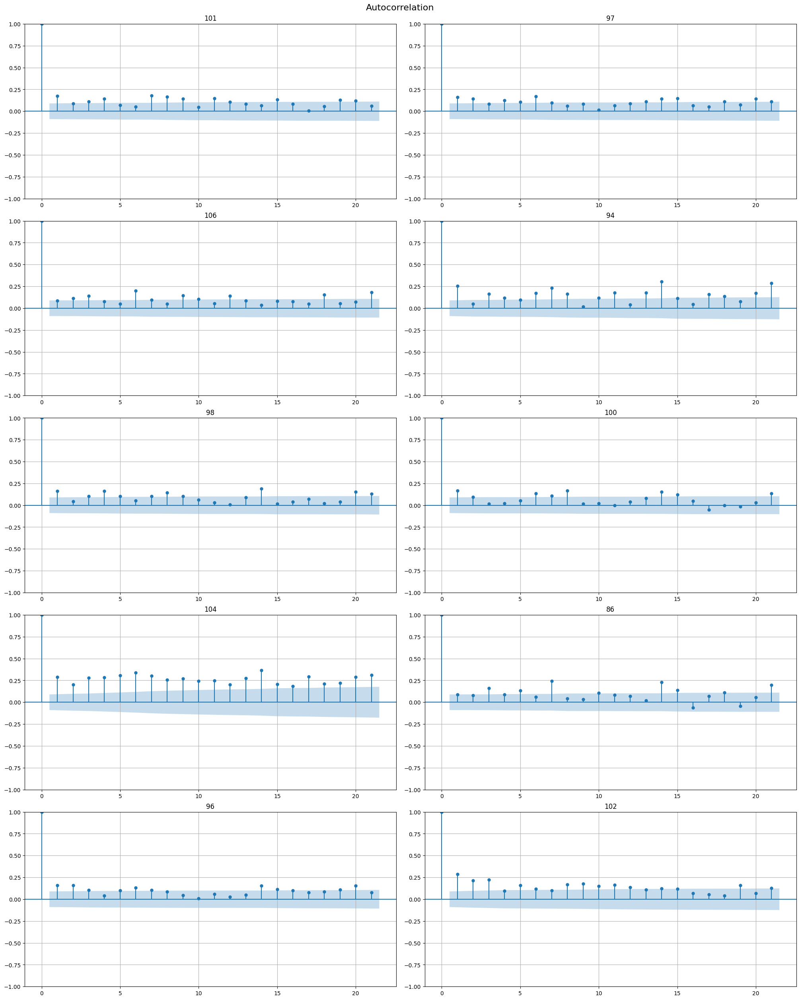

In [ ]:
acf_plot(ts_clear, lags=21)

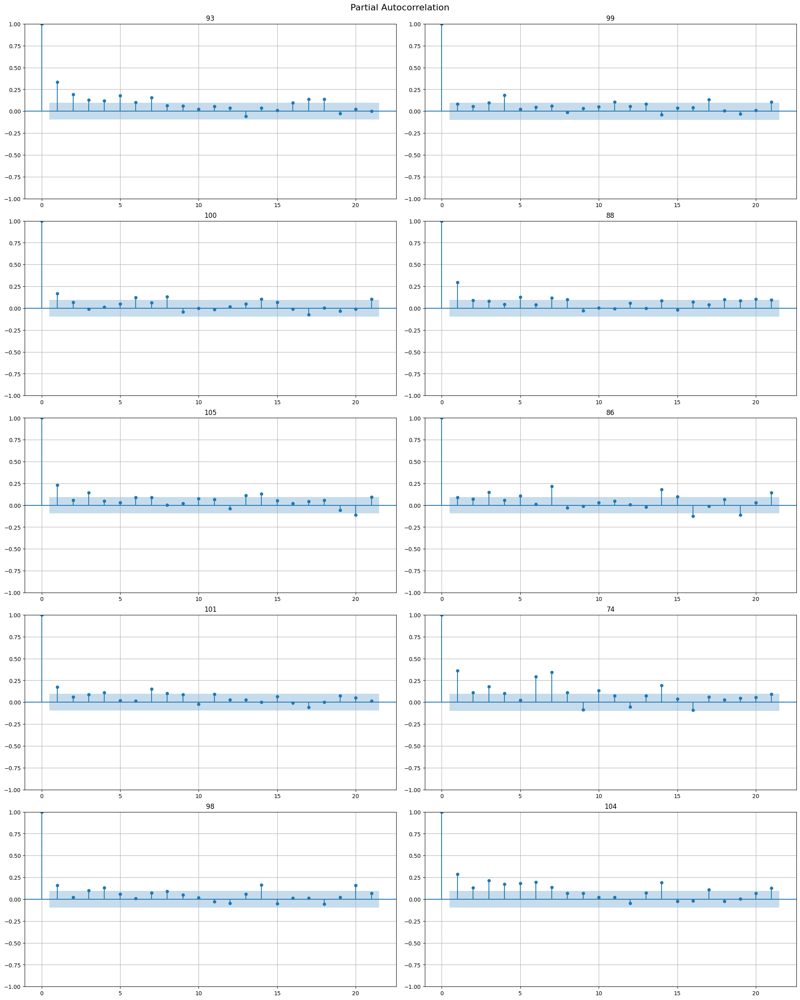

In [ ]:
acf_plot(ts_clear, partial=True, lags=21)

Отметим, что наиболее значимая автокорреляция наблюдается с 1-м и 7-м лагами. Но с семинара мы знаем, что в `Pipeline` нельзя использовать лаги со значением меньше горизонта, так что будем работать только с 7-м лагом. Также я пробовал, брать диапазон лагов, начиная с горизонта, но это не приносило плодов.

#### 2 и 3)

Как мы помним в нашем датасете есть дата, номер банкомата и соответственно значение таргета. Возможно, хотелось бы иметь больше признаков для построения прогноза. Можем попробовать извлечь закономерности из даты, ведь логично предположить, что значение таргета должно быть связано с определенным месяцем / днем недели. Также изучая разные трансформы, я обнаружил `MeanTransform` - расчет среднего для окна. Возможно, это позволит меньше подстраиваться под "аномальные" значения. Также я нашел `SegmentEncoderTransform` - кодирует метку сегмента как категориальную (создастся столбец «segment_code») - вероятно сможем таким образом увеличить количество признаков и получить прогноз лучше.

Более предсказуемым кажется, конечно, необходимость извлекать признаки из даты, ведь мы не обладаем каким-то большим количеством признаков, а корреляция наличности в банкомате с определенными датами очень возможна.

##### CatBoostMultiSegmentModel

In [30]:
boost_multi_pipeline = Pipeline(
    transforms=[
        LagTransform(in_column="target", lags=[7]),
        STLTransform(in_column="target", period=7, model="holt"),
        SegmentEncoderTransform(),
        DateFlagsTransform(
            day_number_in_week=True,
            day_number_in_month=True,
            week_number_in_month=True,
            week_number_in_year=True,
            month_number_in_year=True,
            year_number=True,
        )
    ],
    model=CatBoostMultiSegmentModel(),
    horizon=HORIZON,
)
mae_boost_multi, forecast_boost_multi, _ = boost_multi_pipeline.backtest(ts=ts_clear, metrics=[MAE()], aggregate_metrics=True)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   17.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   35.2s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   52.7s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  1.2min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    5.4s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   10.2s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   17.5s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   23.4s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   30.7s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   30.7s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

In [31]:
mae_boost_multi.mean()

segment    5.005055e+44
MAE        2.793818e+02
dtype: float64

##### CatBoostPerSegmentModel

In [32]:
boost_single_pipeline = Pipeline(
   transforms=[
        LagTransform(in_column="target", lags=[7]),
        STLTransform(in_column="target", period=7, model="holt"),
        SegmentEncoderTransform(),
        DateFlagsTransform(
            day_number_in_week=True,
            day_number_in_month=True,
            week_number_in_month=True,
            week_number_in_year=True,
            month_number_in_year=True,
            year_number=True,
        )
    ],
    model=CatBoostPerSegmentModel(),
    horizon=HORIZON,
)
mae_boost_single, forecast_boost_single, _ = boost_single_pipeline.backtest(ts=ts_clear, metrics=[MAE()], aggregate_metrics=True)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  2.2min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  3.3min
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  4.4min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  5.6min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  5.6min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    6.3s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   11.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   16.2s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   22.3s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   27.4s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   27.4s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

In [33]:
mae_boost_single.mean()

segment    5.005055e+44
MAE        2.829260e+02
dtype: float64

##### AutoARIMAModel

In [34]:
arima_pipeline = Pipeline(
     transforms=[
        LagTransform(in_column="target", lags=[7]),
        SegmentEncoderTransform(),
         DateFlagsTransform(
            day_number_in_week=True,
            day_number_in_month=True,
            week_number_in_month=True,
            week_number_in_year=True,
            month_number_in_year=True,
            year_number=True,
        )
    ],
    model=AutoARIMAModel(),
    horizon=HORIZON,
)
mae_arima, forecast_arima, _ = arima_pipeline.backtest(ts=ts_clear, metrics=[MAE()], aggregate_metrics=True)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   45.9s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.4min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  2.3min
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  3.2min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  4.8min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  4.8min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    4.5s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    8.2s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   11.5s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   15.4s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   19.8s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   19.8s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

In [35]:
mae_arima.mean()

segment    5.005055e+44
MAE        2.407146e+02
dtype: float64

С добавлением `DateFlagsTransform` мы извлекаем основные признаки на основе даты $\Rightarrow$ получаем меньшее значение лосса.

`MeanTransform` успеха не принес, так что пришлось его убрать.

Добавление `SegmentEncoderTransform`'ом признаков, несущих информацию о сегменте, позволило улучшить результат.

##### VotingEnsemble

In [ ]:
voting_ensemble = VotingEnsemble(pipelines=[boost_multi_pipeline, boost_single_pipeline, arima_pipeline], weights=[3, 2, 7], n_jobs=4)
voting_ensamble_metrics = voting_ensemble.backtest(
    ts=ts_clear,
    metrics=[MAE(), SMAPE()],
    n_folds=5,
    aggregate_metrics=True,
    n_jobs=2,
)[0].iloc[:, 1:]

[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:   45.4s
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:   44.7s
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:  2.7min
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:  2.7min
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:  4.1min
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:  4.1min
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:  4.2min
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:  4.2min
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:  4.2min
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:  4.3min
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:   33.7s
[Parallel(n_jobs=4)]: Done   1 tasks      | elapsed:   32.9s
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:  2.6min
[Parallel(n_jobs=4)]: Done   2 tasks      | elapsed:  2.6min
[Parallel(n_jobs=4)]: Done   3 tasks      | elapsed:  4.5min

In [ ]:
voting_ensamble_metrics.mean()

MAE      246.612789
SMAPE     77.643620
dtype: float64

##### StackingEnsemble

In [ ]:
stacking_ensemble_unfeatured = StackingEnsemble(pipelines=[boost_multi_pipeline, boost_single_pipeline, arima_pipeline], n_jobs=4)
stacking_ensamble_metrics = stacking_ensemble_unfeatured.backtest(
    ts=ts_clear,
    metrics=[MAE(), SMAPE()],
    n_folds=5,
    aggregate_metrics=True,
    n_jobs=2,
)[0].iloc[:, 1:]

[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   30.8s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   32.3s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.0min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.0min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    8.0s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    8.4s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   18.4s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   19.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   29.3s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   29.3s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s

In [ ]:
stacking_ensamble_metrics.mean()

MAE      243.599201
SMAPE     73.964156
dtype: float64

##### DirectEnsemble

In [ ]:
boost_multi_pipeline_1 = Pipeline(
    transforms=[
        LagTransform(in_column="target", lags=list(range(HORIZON, HORIZON + 21))),
        STLTransform(in_column="target", period=7, model="holt"),
        SegmentEncoderTransform(),
        DateFlagsTransform(
            day_number_in_week=True,
            day_number_in_month=True,
            week_number_in_month=True,
            week_number_in_year=True,
            month_number_in_year=True,
            year_number=True,
        )
    ],
    model=CatBoostMultiSegmentModel(),
    horizon=HORIZON,
)

boost_multi_pipeline_2 = Pipeline(
    transforms=[
        LagTransform(in_column="target", lags=list(range(HORIZON * 2, HORIZON * 2 + 21))),
        STLTransform(in_column="target", period=7, model="holt"),
        SegmentEncoderTransform(),
        DateFlagsTransform(
            day_number_in_week=True,
            day_number_in_month=True,
            week_number_in_month=True,
            week_number_in_year=True,
            month_number_in_year=True,
            year_number=True,
        )
    ],
    model=CatBoostMultiSegmentModel(),
    horizon=HORIZON * 2,
)


direct_ensemble = DirectEnsemble(pipelines=[boost_multi_pipeline_1, boost_multi_pipeline_2])
direct_ensemble_metrics, _, _ = direct_ensemble.backtest(
    ts=ts_clear,
    metrics=[MAE(), SMAPE()],
    n_folds=5,
    aggregate_metrics=True,
    n_jobs=2,
)

[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   44.4s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   45.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.5min
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.5min
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   45.8s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   46.5s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.5min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.5min
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:  3.1min remaining:  2.0min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.6min
[Parallel(n_jobs=1)]: Done   2 tasks     

In [ ]:
direct_ensemble_metrics.mean()

segment    5.005055e+44
MAE        2.621241e+02
SMAPE      9.147003e+01
dtype: float64

Итого: среди двух моделей бустинга и аримы, а также их ансамлей лучше всего себя показала арима (также заметим, что `DirectEnsemble` для бустинга значительно улучшил изначальный результат бустинга).

Заметим, что пока лучшие результаты это `ProphetModel` ($MAE = 237$) и иерархический временной ряд ($MAE = 225$).

### Задание 6. Стратегии прогнозирования (1.25 балла)

Как нам известно по семинарским занятиям, при построении прогноза на горизонте дальше следующего наблюдения перед нами встает задача определиться со стратегией генерации прогноза. Попробуйте разные стратегии на нашем горизонте из 5 дней (прямая, рекурсивная). Какая стратегия в совокупности с какой моделью дает лучший результат?

Учитывайте особенности, которые некоторые стратегии могут накладывать на признаки (в частности, на лаговые переменные).

При необходимости, в смешанном методе пользуйтесь упрощенной схемой спецификации моделей/преобразований.

In [37]:
from etna.pipeline import AutoRegressivePipeline, Pipeline, assemble_pipelines
from etna.ensembles import DirectEnsemble

#### AutoRegressivePipeline

В отличие от `Pipeline` в `AutoRegressivePipeline` можно использовать лаги со значением меньше горизонта. Пробуя разные лаги лучшие результаты получались при взятии диапазона лагов, начиная с единицы.  

Интересно, что при данном пайплайне `STLTransform` для бустинга только ухудшает результат, так что обойдемся без этого трансформа.

In [38]:
recursive_boost_multi_pipeline = AutoRegressivePipeline(
    transforms=[
        LagTransform(in_column="target", lags=list(range(1, 21))),
        SegmentEncoderTransform(),
        DateFlagsTransform(
            day_number_in_week=True,
            day_number_in_month=True,
            week_number_in_month=True,
            week_number_in_year=True,
            month_number_in_year=True,
            year_number=True,
        )
    ],
    model=CatBoostMultiSegmentModel(),
    horizon=HORIZON,
    step=1,
)

recursive_boost_multi_metrics, _, _ = recursive_boost_multi_pipeline.backtest(ts=ts_clear, metrics=[MAE(), SMAPE()], aggregate_metrics=True)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   19.6s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   45.4s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  1.4min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  1.8min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:  1.8min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    3.5s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    5.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    7.1s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    8.7s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    8.7s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Do

In [39]:
recursive_boost_multi_metrics.mean()

segment    5.005055e+44
MAE        2.432222e+02
SMAPE      7.705611e+01
dtype: float64

In [40]:
recursive_boost_single_pipeline = AutoRegressivePipeline(
    transforms=[
        LagTransform(in_column="target", lags=list(range(1, 21))),
        SegmentEncoderTransform(),
        DateFlagsTransform(
            day_number_in_week=True,
            day_number_in_month=True,
            week_number_in_month=True,
            week_number_in_year=True,
            month_number_in_year=True,
            year_number=True,
        )
    ],
    model=CatBoostPerSegmentModel(),
    horizon=HORIZON,
    step=1,
)

recursive_boost_single_metrics, _, _ = recursive_boost_single_pipeline.backtest(ts=ts_clear, metrics=[MAE(), SMAPE()], aggregate_metrics=True)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  2.9min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  5.9min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  8.9min
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed: 11.9min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed: 14.8min
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed: 14.8min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    5.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    7.5s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   11.4s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   13.8s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   13.8s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Do

In [41]:
recursive_boost_single_metrics.mean()

segment    5.005055e+44
MAE        2.525300e+02
SMAPE      8.474539e+01
dtype: float64

При применении `AutoRegressivePipeline` к модели `ARIMA` с нашими трансформами возникают ошибки связанные с размерами.

In [42]:
recursive_prophet_pipeline = AutoRegressivePipeline(
    transforms=[
        LagTransform(in_column="target", lags=list(range(1, 21))),
        SegmentEncoderTransform(),
        DateFlagsTransform(
            day_number_in_week=True,
            day_number_in_month=True,
            week_number_in_month=True,
            week_number_in_year=True,
            month_number_in_year=True,
            year_number=True,
        )
    ],
    model=ProphetModel(),
    horizon=HORIZON,
    step=1,
)

recursive_prophet_metrics, _, _ = recursive_prophet_pipeline.backtest(ts=ts_clear, metrics=[MAE(), SMAPE()], aggregate_metrics=True)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/erwoxfr2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/4gykev16.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90686', 'data', 'file=/tmp/tmpq9fjolgi/erwoxfr2.json', 'init=/tmp/tmpq9fjolgi/4gykev16.json', 'output', 'file=/tmp/tmpq9fjolgi/prophet_modelks9qfz0w/prophet_model-20240514110208.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:02:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:02:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

In [43]:
recursive_prophet_metrics.mean()

segment    5.005055e+44
MAE        2.459101e+02
SMAPE      7.667899e+01
dtype: float64

#### Pipeline

`Pipeline` для бустинга и аримы был уже проанализирован в прошлом номере $⇒$ рассмотрим `ProphetModel`: попробуем добавить трансформы.

In [44]:
prophet_upd_pipeline = Pipeline(
    transforms=[
        LagTransform(in_column="target", lags=[7]),
        SegmentEncoderTransform(),
        DateFlagsTransform(
            day_number_in_week=True,
            day_number_in_month=True,
            week_number_in_month=True,
            week_number_in_year=True,
            month_number_in_year=True,
            year_number=True,
        )
    ],
    model=ProphetModel(),
    horizon=HORIZON,
)
prophet_upd_metrics, _, _ = prophet_upd_pipeline.backtest(ts=ts_clear, metrics=[MAE(), SMAPE()], aggregate_metrics=True)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/jkwzvkjr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/kgbxlz8w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69624', 'data', 'file=/tmp/tmpq9fjolgi/jkwzvkjr.json', 'init=/tmp/tmpq9fjolgi/kgbxlz8w.json', 'output', 'file=/tmp/tmpq9fjolgi/prophet_modelgkf6y601/prophet_model-20240514110405.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:04:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:04:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

In [45]:
prophet_upd_metrics.mean()

segment    5.005055e+44
MAE        2.393556e+02
SMAPE      7.323368e+01
dtype: float64

Трансформы, в том числе добавление разных лагов не улучшили качество изначального `ProphetModel`. Так что в разделах, где нужны лаги, не будем рассматривать эту модель.

#### DirectEnsemble

Эта прямая стратегия в применении к бустингу уже была рассмотрена в прошлом номере. Здесь посмотрим на другую модель.

In [ ]:
arima_pipeline_1 = Pipeline(
    transforms=[
        LagTransform(in_column="target", lags=list(range(HORIZON, HORIZON + 21))),
        SegmentEncoderTransform(),
        DateFlagsTransform(
            day_number_in_week=True,
            day_number_in_month=True,
            week_number_in_month=True,
            week_number_in_year=True,
            month_number_in_year=True,
            year_number=True,
        )
    ],
    model=AutoARIMAModel(),
    horizon=HORIZON,
)

arima_pipeline_2 = Pipeline(
    transforms=[
        LagTransform(in_column="target", lags=list(range(HORIZON * 2, HORIZON * 2 + 21))),
        SegmentEncoderTransform(),
        DateFlagsTransform(
            day_number_in_week=True,
            day_number_in_month=True,
            week_number_in_month=True,
            week_number_in_year=True,
            month_number_in_year=True,
            year_number=True,
        )
    ],
    model=AutoARIMAModel(),
    horizon=HORIZON * 2,
)


direct_ensemble_arima = DirectEnsemble(pipelines=[arima_pipeline_1, arima_pipeline_2])
direct_ensemble_arima_metrics, _, _ = direct_ensemble_arima.backtest(
    ts=ts_clear,
    metrics=[MAE(), SMAPE()],
    aggregate_metrics=True,
    n_jobs=2,
)

[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  5.4min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  5.5min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed: 10.4min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed: 10.4min
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed: 10.4min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed: 10.6min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed: 10.6min
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed: 10.6min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  5.4min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  5.3min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed: 10.7min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed: 10.7min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed: 10.6min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed: 10.6min
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed: 21.2min

In [ ]:
direct_ensemble_arima_metrics.mean()

segment    5.005055e+44
MAE        2.393981e+02
SMAPE      8.372522e+01
dtype: float64

По сравнению с обычной аримой получен небольшой прирост в качестве.

#### assemble_pipelines

In [ ]:
models = [CatBoostMultiSegmentModel(), CatBoostMultiSegmentModel()]
transforms = [
    STLTransform(in_column="target", period=7, model="holt"),
    SegmentEncoderTransform(),
    DateFlagsTransform(
        day_number_in_week=True,
        day_number_in_month=True,
        week_number_in_month=True,
        week_number_in_year=True,
        month_number_in_year=True,
        year_number=True,
    ),
    [
        LagTransform(in_column="target", lags=list(range(HORIZON, HORIZON + 21))),
        LagTransform(in_column="target", lags=list(range(HORIZON * 2, HORIZON * 2 + 21))),
    ],
]

pipelines = assemble_pipelines(models=models, transforms=transforms, horizons=[HORIZON, HORIZON * 2])
assembled_ensemble = DirectEnsemble(pipelines=pipelines)
assembled_ensemble_metrics, _, _ = assembled_ensemble.backtest(ts=ts_clear, metrics=[MAE(), SMAPE()], aggregate_metrics=True)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   24.4s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   46.8s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   46.8s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   46.9s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   21.9s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   49.8s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   49.8s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  1.6min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   29.5s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   56.3s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   56.3s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:  2.6min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   25.3s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   54.6s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   54.6s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  3.5min
[Parallel(n_jobs=1)]: Do

In [ ]:
assembled_ensemble_metrics.mean()

segment    5.005055e+44
MAE        2.731257e+02
SMAPE      9.488595e+01
dtype: float64

In [ ]:
models = [AutoARIMAModel(), AutoARIMAModel()]
transforms = [
    SegmentEncoderTransform(),
    DateFlagsTransform(
        day_number_in_week=True,
        day_number_in_month=True,
        week_number_in_month=True,
        week_number_in_year=True,
        month_number_in_year=True,
        year_number=True,
    ),
    [
        LagTransform(in_column="target", lags=list(range(HORIZON, HORIZON + 21))),
        LagTransform(in_column="target", lags=list(range(HORIZON * 2, HORIZON * 2 + 21))),
    ],
]

arima_pipelines = assemble_pipelines(models=models, transforms=transforms, horizons=[HORIZON, HORIZON * 2])
assembled_arima = DirectEnsemble(pipelines=arima_pipelines)
assembled_arima_metrics, _, _ = assembled_arima.backtest(ts=ts_clear, metrics=[MAE(), SMAPE()], aggregate_metrics=True)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  2.7min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  5.1min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  5.1min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  5.1min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  2.4min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  5.0min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  5.0min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed: 10.1min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  2.8min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  5.8min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  5.8min
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed: 16.0min
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  2.9min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  5.6min
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:  5.6min
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed: 21.6min
[Parallel(n_jobs=1)]: Do

In [ ]:
assembled_arima_metrics.mean()

segment    5.005055e+44
MAE        2.394205e+02
SMAPE      8.375517e+01
dtype: float64

#### Выводы

Напомню, что лучшие результаты, полученные в прошлых номерах: прямая стратегия `Pipeline` для `ProphetModel` ($MAE = 236.8$) и для `ARIMA` ($MAE = 240.7$), а также `ProphetModel` для иерархического временного ряда ($MAE = 224.8$).

Если говорить о данном номере, то лучшее значение метрик было получено для `ProphetModel` с трансформами в прямой стратегии `pipeline` ($MAE = 239.4$) и `ARIMA` в прямой стратегии `DirectEnsemble` и в `assemble_pipelines` с `DirectEnsemble` ($MAE = 239.4$).

Таким образом, хоть мы и не имеем категорической доминации определенной модели с определенной стратегией, однако `ProphetModel` в совокупности с `HierarchicalPipeline` дает лучший результат, после него `ProphetModel` в совокупности с `Pipeline` (это лучшее качество из моделей касающихся этого номера, ведь иерархия в текущем задании вообще не фигурировала).

### Задание 7. Ансамбли (1.25 балла)

Чтобы не выбирать лучшую модель, мы можем использовать преимущества каждой - давайте объединим все наши наработки в ансамбль. Попробуйте различные опции ансамблирования, и выберите ту, которая работает лучше всего (не забывайте, что внутри каждого ансамбля у нас тоже есть параметры, которые мы можем варьировать - веса в voting, включаемые признаки в stacking).

In [46]:
from etna.ensembles import StackingEnsemble, VotingEnsemble

К сожалению, данные ансамбли не позволяют использовать нам полученный ранее иерархический пайплайн, возникают ошибки :(

#### VotingEnsemble

In [ ]:
all_pipelines = [prophet_pipeline, boost_multi_pipeline, boost_single_pipeline, arima_pipeline,
 recursive_boost_multi_pipeline, recursive_boost_single_pipeline, recursive_prophet_pipeline, prophet_upd_pipeline]

In [ ]:
voting_ensemble_final = VotingEnsemble(pipelines=all_pipelines, weights=[11, 1, 1, 9, 7, 3, 5, 9], n_jobs=4)
voting_ensamble_final_metrics = voting_ensemble_final.backtest(
    ts=ts_clear,
    metrics=[MAE(), SMAPE()],
    aggregate_metrics=True,
    n_jobs=2,
)[0].iloc[:, 1:]

[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp8wrbex3g/8hyi7teh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp8wrbex3g/q6zdznum.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37308', 'data', 'file=/tmp/tmp8wrbex3g/8hyi7teh.json', 'init=/tmp/tmp8wrbex3g/q6zdznum.json', 'output', 'file=/tmp/tmp8wrbex3g/prophet_model_tp1v0zc/prophet_model-20240513190826.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:08:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:08:26 - cmdstanpy - INFO - Chain [1] done proces

In [ ]:
voting_ensamble_final_metrics.mean()

MAE      237.351275
SMAPE     73.478621
dtype: float64

Я поэксперементировал с весами и в лучшем случае получил значение $MAE = 237.35$, при этом бОльшие веса отдавались моделям, показавшим себя лучше в прошлых заданиях. Этот результат чуть хуже чем у `ProphetModel` в совокупности с `Pipeline`, но лучше всех остальных использованных здесь отдельных моделей.

#### StackingEnsemble

Ранее мы уже обучали такой ансамбль с 3 моделями и это было долго. Сейчас у нас 9 моделей... так что дабы не сидеть тут до конца жесткого дедлайна, уберем модели, выбивающиеся (в худшую сторону) по качеству, а также `ProphetModel` с трансформами, ведь как мы помним, трансформы только ухудшили результат исходного Prophet'а, который в наших пайпланах и так присутствует.

In [53]:
all_pipelines = [prophet_pipeline, arima_pipeline, recursive_boost_multi_pipeline, recursive_boost_single_pipeline, recursive_prophet_pipeline]

In [48]:
stacking_ensemble_final = StackingEnsemble(pipelines=all_pipelines, n_jobs=4)
stacking_ensamble_final_metrics = stacking_ensemble_final.backtest(
    ts=ts_clear,
    metrics=[MAE(), SMAPE()],
    aggregate_metrics=True,
    n_jobs=2,
)[0].iloc[:, 1:]

Выходные данные были обрезаны до нескольких последних строк (5000).
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/6iat585v.json
11:39:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/fu1kh1lw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10118', 'data', 'file=/tmp/tmpq9fjolgi/6iat585v.json', 'init=/tmp/tmpq9fjolgi/fu1kh1lw.json', 'output', 'file=/tmp/tmpq9fjolgi/prophet_model3869w23n/prophet_model-20240514113956.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:39:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:D

In [52]:
stacking_ensamble_final_metrics.mean()

MAE      240.726595
SMAPE     73.014619
dtype: float64

In [55]:
stacking_ensemble_final = StackingEnsemble(pipelines=all_pipelines, features_to_use='all', n_jobs=8)
stacking_ensamble_final_metrics = stacking_ensemble_final.backtest(
    ts=ts_clear,
    metrics=[MAE(), SMAPE()],
    aggregate_metrics=True,
    n_jobs=4,
)[0].iloc[:, 1:]

Выходные данные были обрезаны до нескольких последних строк (5000).
13:39:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:cmdstanpy:Chain [1] start processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/raqqye1q.json
13:39:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/t0u9y7td.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/6ts8yb47.json
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed: 38.1min
DEBUG:cmdstanpy:idx 0
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed: 38.1min
DEBUG:cmdstanpy:input tempfile: /tmp/tmpq9fjolgi/j474e956.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
13:39:21 - cmdstanpy - INFO - Chain [1] start processing
DEBUG:cm

In [56]:
stacking_ensamble_final_metrics.mean()

MAE      248.871817
SMAPE     73.753601
dtype: float64

Видим, что `VotingEnsemble` показал себя лучше, чем `StackingEnsemble`, а также что использование признаков во втором ансамбле лишь ухудшило первоначальный результат.

### Задание 8*. Трансформер (бонус 2 балла)

Для желающих протестировать мощь трансформенных моделей предлагается "завести" модель из второго семинара по временным рядам на текущем датасете. На этот раз абсолютно все необходимые импорты и зависимости подгружаются на ваше усмотрение. Удалось ли вам улучшить качество по сравнению с классическими моделями / моделями на основе ML? Что бы вы предпочли внедрить в production?

*NB:* все, конечно, прекрасно знают механизм работы бонусных заданий, но порядка ряди прописать дисклеймер должны - итоговый балл за домашнее задание ставится по формуле min(10, ваш суммарный балл за задания).

In [ ]:
#YOUR CODE HERE#